## Install libraries

In [2]:
!nvidia-smi

Fri Jun 11 05:38:56 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 465.27       Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   43C    P8    10W /  70W |      0MiB / 15109MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [3]:
!pip install git+git://github.com/airctic/icevision.git#egg=icevision[all] --upgrade -q
!pip install git+git://github.com/airctic/icedata.git -q
!pip install yolov5-icevision --upgrade -q
!pip install fastai fastcore --upgrade -q

     |████████████████████████████████| 61kB 5.2MB/s 
     |████████████████████████████████| 81kB 7.1MB/s 
     |████████████████████████████████| 81kB 11.6MB/s 
     |████████████████████████████████| 61kB 10.0MB/s 
     |████████████████████████████████| 61kB 10.4MB/s 
     |████████████████████████████████| 3.0MB 52.4MB/s 
     |████████████████████████████████| 204kB 51.4MB/s 
     |████████████████████████████████| 808kB 36.7MB/s 
     |████████████████████████████████| 112kB 63.2MB/s 
     |████████████████████████████████| 81kB 11.0MB/s 
     |████████████████████████████████| 1.8MB 46.8MB/s 
     |████████████████████████████████| 51kB 6.1MB/s 
     |████████████████████████████████| 952kB 42.9MB/s 
     |████████████████████████████████| 38.2MB 69kB/s 
     |████████████████████████████████| 829kB 45.7MB/s 
     |████████████████████████████████| 10.6MB 178kB/s 
     |████████████████████████████████| 276kB 57.4MB/s 
     |████████████████████████████████| 112kB 58.3MB/s 
   

In [4]:
import fastai, fastcore, icevision
print(f'fastai: {fastai.__version__}')
print(f'fastcore: {fastcore.__version__}')
print(f'icevision: {icevision.__version__}')

INFO     - Downloading default `.ttf` font file - SpaceGrotesk-Medium.ttf from https://raw.githubusercontent.com/airctic/storage/master/SpaceGrotesk-Medium.ttf to /root/.icevision/fonts/SpaceGrotesk-Medium.ttf | icevision.visualize.utils:get_default_font:69


2.3.1 1.3.20 0.8.0


## Download data

In [5]:
from fastai.basics import *
from gdown import download

In [6]:
url_train = 'https://drive.google.com/uc?id=1GLhRmlAG9J_ZrTkyvWq0TKPWVGM_b12c'
download(url_train, 'train.zip', quiet=True)
file_extract('train.zip')

## Process data

In [1]:
from fastai.vision.all import *
from icevision.all import *

SEED = 42
set_seed(42, reproducible=True)

In [2]:
path = Path('c1_release')
path.ls()

(#5) [Path('c1_release/val.json'),Path('c1_release/CREDITS.txt'),Path('c1_release/train.json'),Path('c1_release/labels.json'),Path('c1_release/images')]

In [3]:
# Create the parser (COCO format)
train_parser = parsers.COCOBBoxParser(annotations_filepath=path/'train.json', img_dir=path/'images')
valid_parser = parsers.COCOBBoxParser(annotations_filepath=path/'val.json', img_dir=path/'images')

train_parser.class_map, valid_parser.class_map

(<ClassMap: {'background': 0, 'Cat': 1, 'Dog': 2, 'Bird': 3, 'Chicken': 4, 'Snake': 5}>,
 <ClassMap: {'background': 0, 'Cat': 1, 'Dog': 2, 'Bird': 3, 'Chicken': 4, 'Snake': 5}>)

In [4]:
# Parse annotations to create records
train_records = train_parser.parse(data_splitter=SingleSplitSplitter())[0]
valid_records = valid_parser.parse(data_splitter=SingleSplitSplitter())[0]

  0%|          | 0/5571 [00:00<?, ?it/s]

INFO     - Autofixing records | icevision.parsers.parser:parse:136


  0%|          | 0/4207 [00:00<?, ?it/s]

  0%|          | 0/604 [00:00<?, ?it/s]

INFO     - Autofixing records | icevision.parsers.parser:parse:136


  0%|          | 0/468 [00:00<?, ?it/s]

In [5]:
len(train_records), len(valid_records)

(4207, 468)

In [6]:
# Transforms
image_size, image_pre_size = 384, 512
train_tfms = tfms.A.Adapter([*tfms.A.aug_tfms(image_size, image_pre_size), tfms.A.Normalize()])
valid_tfms = tfms.A.Adapter([*tfms.A.resize_and_pad(image_size), tfms.A.Normalize()])

In [7]:
# Datasets
train_ds = Dataset(train_records, train_tfms)
valid_ds = Dataset(valid_records, valid_tfms)

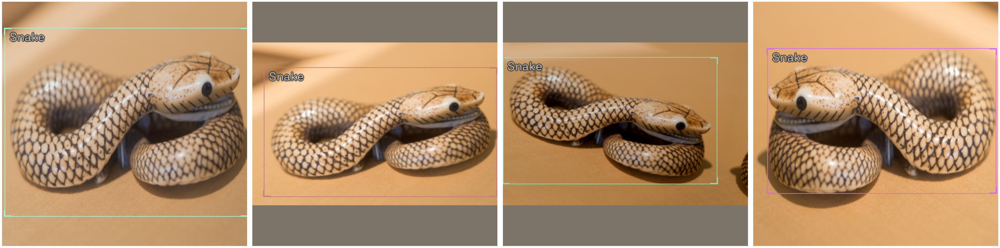

In [8]:
# Show an element of the train_ds with augmentation transformations applied
samples = [train_ds[0] for _ in range(4)]
show_samples(samples, ncols=4)

## Train model

In [9]:
model_name = 'yolo-xlarge'

In [10]:
# Just change the value of selection to try another model

selection = 3
extra_args = {}

if selection == 2:
    model_type = models.ross.efficientdet
    backbone = model_type.backbones.tf_d7
    extra_args['img_size'] = image_size

if selection == 3:
    model_type = models.ultralytics.yolov5
    backbone = model_type.backbones.extra_large
    extra_args['img_size'] = image_size

model_type, backbone, extra_args

(<module 'icevision.models.ultralytics.yolov5' from '/usr/local/lib/python3.7/dist-packages/icevision/models/ultralytics/yolov5/__init__.py'>,
 {'img_size': 384})

In [11]:
# Instantiate the mdoel
model = model_type.model(backbone=backbone(pretrained=True), num_classes=len(train_parser.class_map), **extra_args) 

In [12]:
# Data Loaders (adjust batch_size & num_workers accordingly)
train_dl = model_type.train_dl(train_ds, batch_size=8, num_workers=4, shuffle=True)
valid_dl = model_type.valid_dl(valid_ds, batch_size=8, num_workers=4, shuffle=False)

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:477: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:477: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


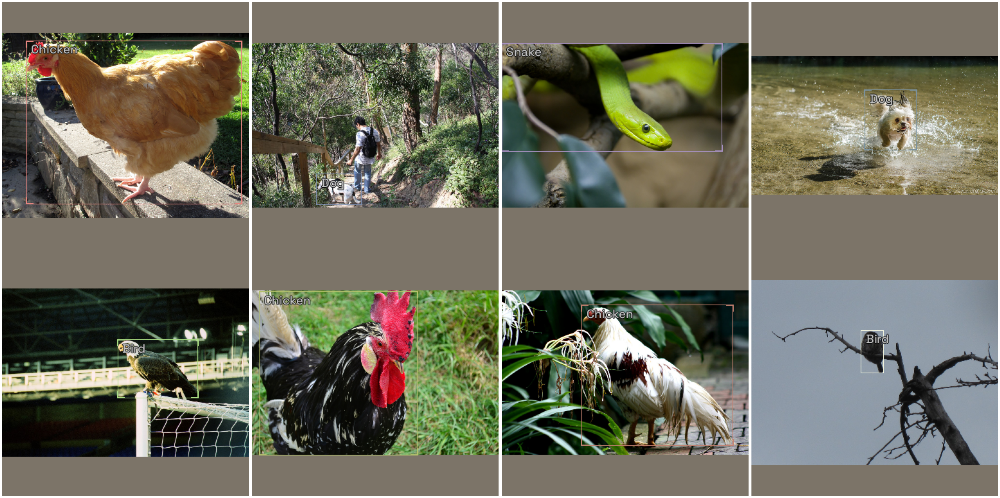

In [13]:
# show batch
model_type.show_batch(first(valid_dl), ncols=4)

In [14]:
metrics = [COCOMetric(metric_type=COCOMetricType.bbox)]
cbs = [SaveModelCallback(monitor='COCOMetric', fname=model_name+'-best'), ReduceLROnPlateau(monitor='valid_loss', min_delta=0.01, patience=10)]

In [15]:
learn = model_type.fastai.learner(dls=[train_dl, valid_dl], model=model, metrics=metrics)

SuggestedLRs(lr_min=3.981071640737355e-05, lr_steep=0.00019054606673307717)

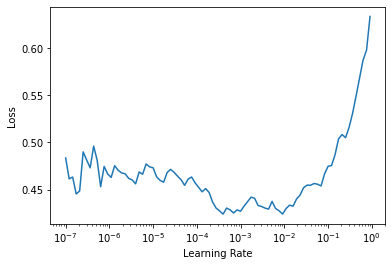

In [16]:
learn.lr_find()

In [ ]:
learn.fine_tune(40, 3e-4, 5, cbs=cbs) # adjust lr accordingly

epoch,train_loss,valid_loss,COCOMetric,time
0,0.353913,0.430053,0.108980,04:57
1,0.260559,0.308405,0.305968,04:58
2,0.235773,0.239606,0.431983,05:00
3,0.222358,0.217146,0.469376,05:00
4,0.199883,0.204875,0.491572,05:00


Better model found at epoch 0 with COCOMetric value: 0.10898016468648845.
Better model found at epoch 1 with COCOMetric value: 0.30596782684709023.
Better model found at epoch 2 with COCOMetric value: 0.4319828275097984.
Better model found at epoch 3 with COCOMetric value: 0.4693762286509433.
Better model found at epoch 4 with COCOMetric value: 0.4915718125547705.


epoch,train_loss,valid_loss,COCOMetric,time
0,0.165696,0.176193,0.603972,07:20
1,0.162513,0.162258,0.636359,07:20
2,0.154728,0.147298,0.690893,07:20
3,0.146258,0.141940,0.713958,07:20
4,0.153862,0.141596,0.703573,07:20
5,0.143235,0.139187,0.698122,07:20
6,0.134376,0.137140,0.670423,07:20
7,0.136877,0.143988,0.695969,07:20
8,0.126708,0.129580,0.716694,07:20
9,0.123386,0.133075,0.713259,07:20


Better model found at epoch 0 with COCOMetric value: 0.6039723335295959.
Better model found at epoch 1 with COCOMetric value: 0.6363586068164364.
Better model found at epoch 2 with COCOMetric value: 0.6908926398520127.
Better model found at epoch 3 with COCOMetric value: 0.7139575004287165.
Better model found at epoch 8 with COCOMetric value: 0.71669369733859.
Better model found at epoch 11 with COCOMetric value: 0.723581032856988.
Better model found at epoch 13 with COCOMetric value: 0.7353184017480421.
Better model found at epoch 16 with COCOMetric value: 0.745338337573767.
Better model found at epoch 18 with COCOMetric value: 0.7523248504395557.
Better model found at epoch 21 with COCOMetric value: 0.7625113891444797.
Better model found at epoch 23 with COCOMetric value: 0.7746885469616395.


In [ ]:
learn.recorder.plot_loss()

In [ ]:
learn.validate()

In [ ]:
model_type.show_results(model, valid_ds, detection_threshold=0.5) # adjust threshold accordingly